In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set(style="white")
np.random.seed(67)

# 0. Read the data
dfd = pd.read_csv('diabetes.csv')

# 1. Basic Description of the Data
print('------ Describe -------\n')
print(dfd.describe())
print('------ Info -------\n')
print(dfd.info())
print('------ Data Type -------\n')
print(dfd.dtypes)

------ Describe -------

       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  120.894531      69.105469      20.536458   79.799479   
std       3.369578   31.972618      19.355807      15.952218  115.244002   
min       0.000000    0.000000       0.000000       0.000000    0.000000   
25%       1.000000   99.000000      62.000000       0.000000    0.000000   
50%       3.000000  117.000000      72.000000      23.000000   30.500000   
75%       6.000000  140.250000      80.000000      32.000000  127.250000   
max      17.000000  199.000000     122.000000      99.000000  846.000000   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  768.000000                768.000000  768.000000  768.000000  
mean    31.992578                  0.471876   33.240885    0.348958  
std      7.884160                  0.331329   11.760232    0.476951  
min      0

In [5]:
# 1. See the first 10 and last 10 
import plotly.graph_objs as go
import plotly.plotly as py
import plotly.tools as tls
import plotly.figure_factory as ff
print('------ First and Last 10 -------\n')
df_table = ff.create_table(dfd.head())
py.iplot(df_table, filename='diabetes-head')

------ First and Last 10 -------



In [6]:
df_table2 = ff.create_table(dfd.tail())
py.iplot(df_table2, filename='diabetes-tail')

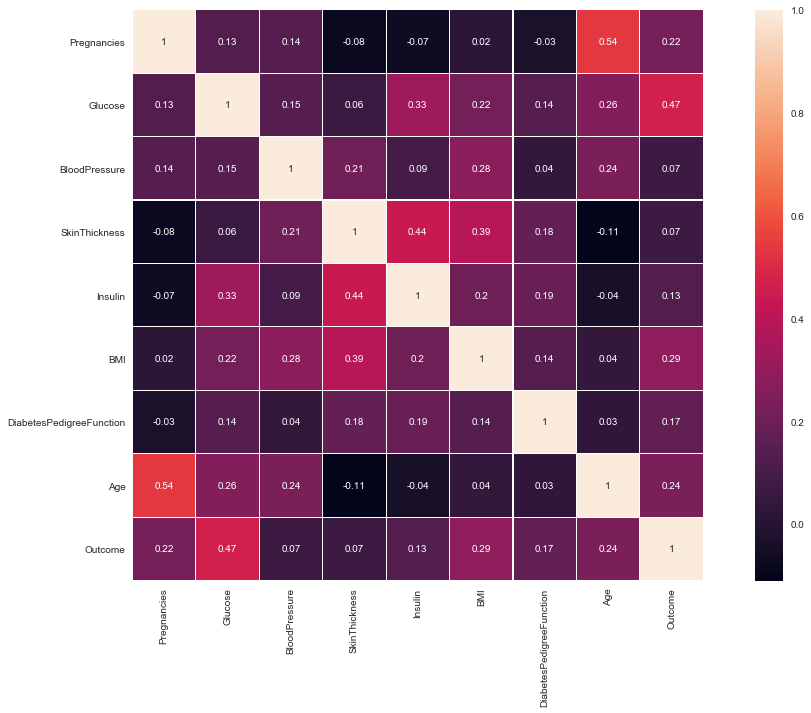

In [7]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
# 2. clustermap heat map
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
sns.heatmap(np.around(dfd.corr(),2),square=True,annot=True,linewidths=.2)
plt.show()

In [8]:
# 3. see the dist of the data
import plotly.plotly as py
import cufflinks as cf
cf.set_config_file(offline=False, world_readable=True, theme='pearl')
dfd.iplot(kind='histogram', bins='auto',subplots=True)

In [9]:
import plotly.graph_objs as go
import plotly.plotly as py
import plotly.tools as tls
import plotly.figure_factory as ff
import copy
import numpy as np
import pandas as pd

textd = ['non-diabetic' if cl==0 else 'diabetic' for cl in dfd['Outcome']]
color_vals = [0  if cl==0 else 1 for cl in dfd['Outcome']]
pl_colorscaled = [[0., '#119dff'],
                 [0.5, '#119dff'],
                 [0.5, '#ef553b'],
                 [1, '#ef553b']]

traced = go.Splom(dimensions=[dict(label='Pregnancies', values=dfd['Pregnancies']),
                              dict(label='Glucose', values=dfd['Glucose']),
                              dict(label='BloodPressure', values=dfd['BloodPressure']),
                              dict(label='SkinThickness', values=dfd['SkinThickness']),
                              dict(label='Insulin', values=dfd['Insulin']),
                              dict(label='BMI', values=dfd['BMI']),
                              dict(label='DiabPedigreeFun', values=dfd['DiabetesPedigreeFunction']),
                              dict(label='Age', values=dfd['Age']),
                              dict(label='Outcome', values=dfd['Outcome'])],
                  marker=dict(color=color_vals,size=5,colorscale=pl_colorscaled,
                              line=dict(width=0.5,color='rgb(230,230,230)') ),
                  text=textd,
                  diagonal=dict(visible=True))

axisd = dict(showline=False,zeroline=False,gridcolor='#ffff',
           ticklen=4,titlefont=dict(size=13))
title = "Scatterplot Matrix (SPLOM) for Diabetes Dataset<br>Data source:"+\
        " <a href='https://www.kaggle.com/uciml/pima-indians-diabetes-database/data'>[1]</a>"

layout = go.Layout(title=title,
                   dragmode='select',
                   width=1000,
                   height=1000,
                   autosize=False,
                   hovermode='closest',
                   plot_bgcolor='rgba(240,240,240, 0.95)',
                   xaxis1=dict(axisd),
                   xaxis2=dict(axisd),
                   xaxis3=dict(axisd),
                   xaxis4=dict(axisd),
                   xaxis5=dict(axisd),
                   xaxis6=dict(axisd),
                   xaxis7=dict(axisd),
                   xaxis8=dict(axisd),
                   yaxis1=dict(axisd),
                   yaxis2=dict(axisd),
                   yaxis3=dict(axisd),
                   yaxis4=dict(axisd),
                   yaxis5=dict(axisd),
                   yaxis6=dict(axisd),
                   yaxis7=dict(axisd),
                   yaxis8=dict(axisd),
                   yaxis9=dict(axisd)
                  )

fig = dict(data=[traced], layout=layout)
py.iplot(fig, filename='splom_test')

In [24]:
import umap
from sklearn.manifold import TSNE
textd = [0 if cl==0 else 1 for cl in dfd['Outcome']]
textd = np.array(textd)

digit_color=['rgba(236,223,1, 0.85)','rgba((1,223,102, 0.7))']

colors=[digit_color[d] for d in textd]
tooltips=list(map(str, textd))

In [25]:
def get_trace3d(reduced_data,  cluster_colors=colors, text=tooltips):
    
    return dict(type='scatter3d',
                x=reduced_data[:,0],
                y=reduced_data[:,1],
                z=reduced_data[:,2],
                mode='markers',
                marker=dict(size=6, color=cluster_colors,line=dict(width=0.5, color='rgb(100,100,100)')),
                text=text,
                hoverinfo='text')                    

In [26]:
from plotly import tools

In [27]:
fig = tools.make_subplots(specs=[[{'is_3d': True},  {'is_3d': True}]], 
                          rows=1,
                          cols=2,
                          print_grid=True,
                          horizontal_spacing=-0.05,
                         )

This is the format of your plot grid:
[ (1,1) scene1 ]  [ (1,2) scene2 ]



In [62]:
%time dim_reduced = umap.UMAP(n_neighbors=15, n_components=3, min_dist=0.98, random_state=7654321).fit_transform(dfd.loc[:, dfd.columns != 'Outcome'])    

Wall time: 1.7 s


In [61]:
%time proj_3d = TSNE(n_components=3, perplexity=20, random_state=7654321).fit_transform(dfd.loc[:, dfd.columns != 'Outcome'])    

Wall time: 26.4 s


In [63]:
tsnet=get_trace3d(proj_3d,  cluster_colors=colors, text=tooltips)
umapt=get_trace3d(dim_reduced,  cluster_colors=colors, text=tooltips)
fig.append_trace(tsnet, 1, 1)
fig.append_trace(umapt, 1, 2)

In [64]:
axis3d = dict(showbackground=True,
              backgroundcolor="rgb(235, 235, 235)",
              gridcolor="rgb(255, 255, 255)",
              zerolinecolor="rgb(255, 255, 255)",
            )

In [65]:
for k in [1,2]:
    fig['layout']['scene{}'.format(k)].update(camera=dict(eye=dict(x=1.6, y=1.2, z=0.9)),
                                       xaxis=axis3d,
                                       yaxis=axis3d, 
                                       zaxis=axis3d,
                                       aspectratio=dict(x=1., y=1., z=0.9))
title='3d Embedding of Diabetes dataset via t-sne (left) and  umap (right)'

fig['layout'].update(title=title,
                     showlegend=False, 
                     width=1000,
                     height=550,
                     autosize=False)
iplot(fig) 

In [66]:
df_small = dfd[['BMI','Glucose','Age','DiabetesPedigreeFunction']]

%time dim_reduced = umap.UMAP(n_neighbors=15, n_components=3, min_dist=0.90, random_state=7654321).fit_transform(dfd)  
%time proj_3d = TSNE(n_components=3, perplexity=20, random_state=7654321).fit_transform(dfd)
tsnet=get_trace3d(proj_3d,  cluster_colors=colors, text=tooltips)
umapt=get_trace3d(dim_reduced,  cluster_colors=colors, text=tooltips)
fig.append_trace(tsnet, 1, 1)
fig.append_trace(umapt, 1, 2)
axis3d = dict(showbackground=True,
              backgroundcolor="rgb(235, 235, 235)",
              gridcolor="rgb(255, 255, 255)",
              zerolinecolor="rgb(255, 255, 255)",
            )
for k in [1,2]:
    fig['layout']['scene{}'.format(k)].update(camera=dict(eye=dict(x=1.6, y=1.2, z=0.9)),
                                       xaxis=axis3d,
                                       yaxis=axis3d, 
                                       zaxis=axis3d,
                                       aspectratio=dict(x=1., y=1., z=0.9))
title='3d Embedding of Diabetes dataset via t-sne (left) and  umap (right)'

fig['layout'].update(title=title,
                     showlegend=False, 
                     width=1000,
                     height=550,
                     autosize=False)
iplot(fig) 

Wall time: 1.76 s
Wall time: 20 s
